In [2]:
import os
import numpy as np
import random
import matplotlib.pyplot as plt
import tensorflow as tf
from collections import defaultdict
from shutil import copy, copytree, rmtree
from tensorflow.keras import regularizers
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing import image

In [11]:
# Check TensorFlow version and GPU
print(tf.__version__)
print(tf.test.gpu_device_name())

2.19.0



In [12]:
# Helper function to check the dataset folder
def check_data():
    if os.path.exists(r'C:\Users\mpawe\Downloads\dataset\images') and os.path.exists(r'C:\Users\mpawe\Downloads\dataset\meta'):
        print("Dataset exists")
    else:
        raise FileNotFoundError("Dataset not found. Please ensure the 'food-101' folder is in the current directory.")

In [13]:
# Check the dataset folder
check_data()

Dataset exists


In [14]:
# Check the extracted dataset folder
print(os.listdir(r'C:\Users\mpawe\Downloads\dataset\images'))
print(os.listdir(r'C:\Users\mpawe\Downloads\dataset\meta'))

['chicken_wings', 'chocolate_cake', 'donuts', 'french_fries', 'french_toast', 'fried_rice', 'hamburger', 'ice_cream', 'omelette', 'pancakes', 'pizza', 'pork_chop', 'samosa', 'spring_rolls', 'waffles']
['classes.txt', 'filespiter.py', 'labels.txt', 'test.json', 'test.txt', 'train.json', 'train.txt']


In [15]:
with open(r'C:\Users\mpawe\Downloads\dataset\meta\train.txt') as f:
    for _ in range(5):
        print(f.readline().strip())

with open(r'C:\Users\mpawe\Downloads\dataset\meta\classes.txt') as f:
    for _ in range(5):
        print(f.readline().strip())

chicken_wings/1003533
chicken_wings/1008504
chicken_wings/1009927
chicken_wings/101104
chicken_wings/1012615
chicken_wings
chocolate_cake
donuts
french_fries
french_toast


In [16]:
import os

dataset_path = r"C:\Users\mpawe\Downloads\dataset"

for root, dirs, files in os.walk(dataset_path):
    print(f"📁 Folder: {root}")
    print(f"📂 Subfolders: {dirs}")
    print(f"📸 Image Files: {len(files)}")
    print("-" * 40)


📁 Folder: C:\Users\mpawe\Downloads\dataset
📂 Subfolders: ['images', 'meta']
📸 Image Files: 11
----------------------------------------
📁 Folder: C:\Users\mpawe\Downloads\dataset\images
📂 Subfolders: ['chicken_wings', 'chocolate_cake', 'donuts', 'french_fries', 'french_toast', 'fried_rice', 'hamburger', 'ice_cream', 'omelette', 'pancakes', 'pizza', 'pork_chop', 'samosa', 'spring_rolls', 'waffles']
📸 Image Files: 0
----------------------------------------
📁 Folder: C:\Users\mpawe\Downloads\dataset\images\chicken_wings
📂 Subfolders: []
📸 Image Files: 1000
----------------------------------------
📁 Folder: C:\Users\mpawe\Downloads\dataset\images\chocolate_cake
📂 Subfolders: []
📸 Image Files: 1000
----------------------------------------
📁 Folder: C:\Users\mpawe\Downloads\dataset\images\donuts
📂 Subfolders: []
📸 Image Files: 1000
----------------------------------------
📁 Folder: C:\Users\mpawe\Downloads\dataset\images\french_fries
📂 Subfolders: []
📸 Image Files: 1000
----------------------


Class: chicken_wings (5 images)


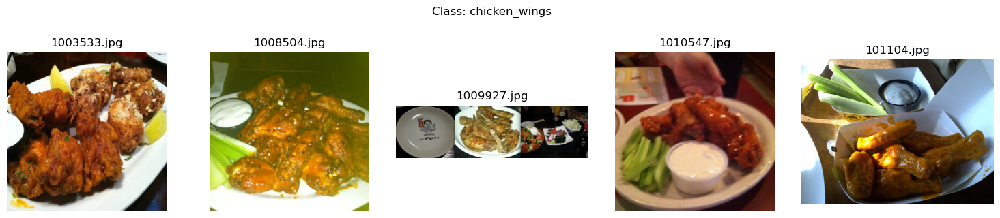


Class: chocolate_cake (5 images)


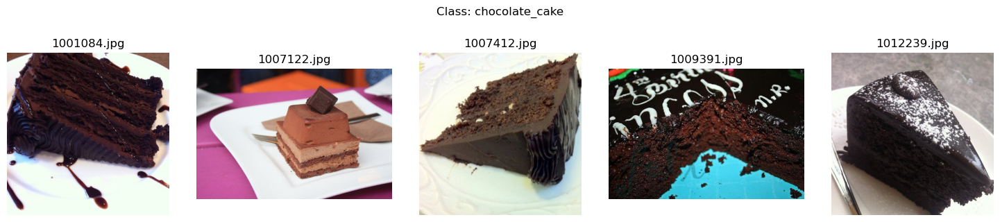


Class: donuts (5 images)


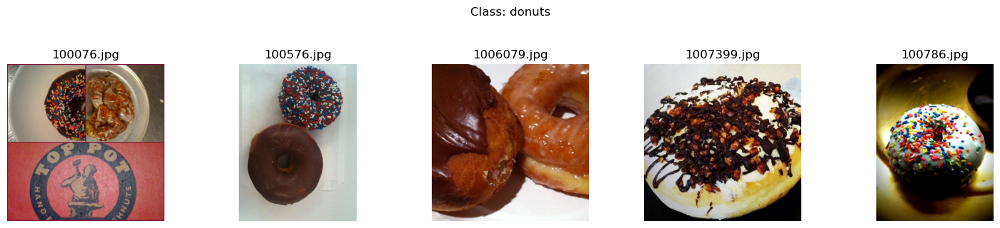


Class: french_fries (5 images)


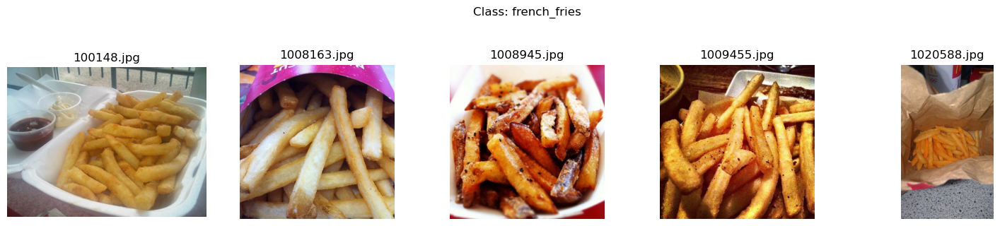


Class: french_toast (5 images)


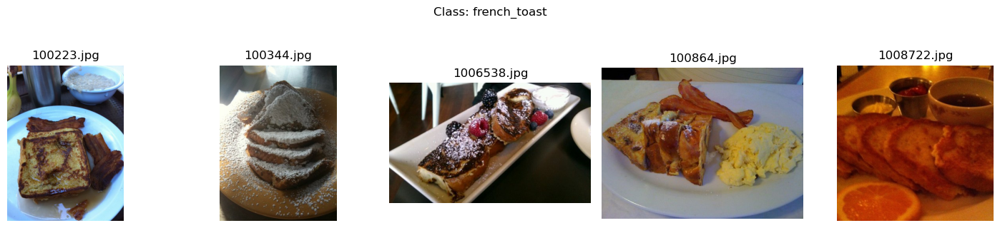


Class: fried_rice (5 images)


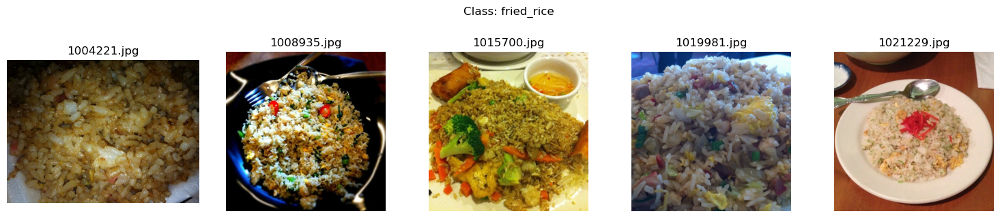


Class: hamburger (5 images)


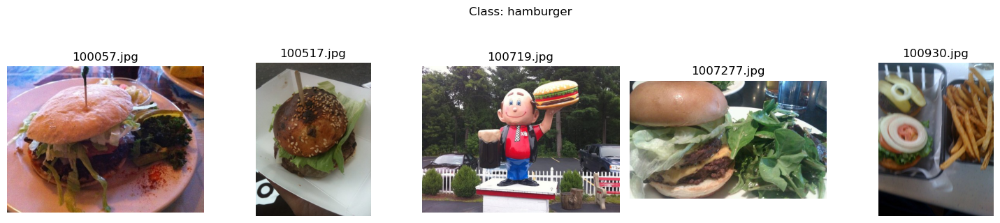


Class: ice_cream (5 images)


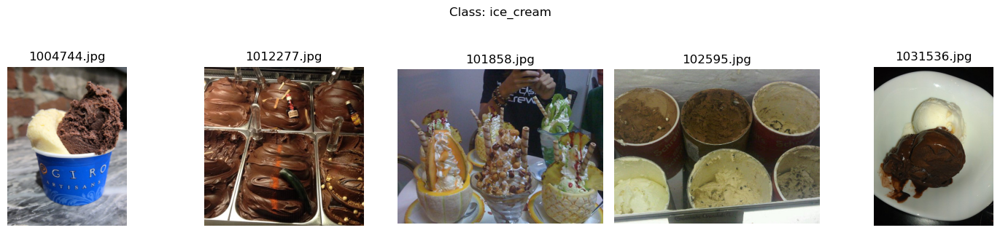


Class: omelette (5 images)


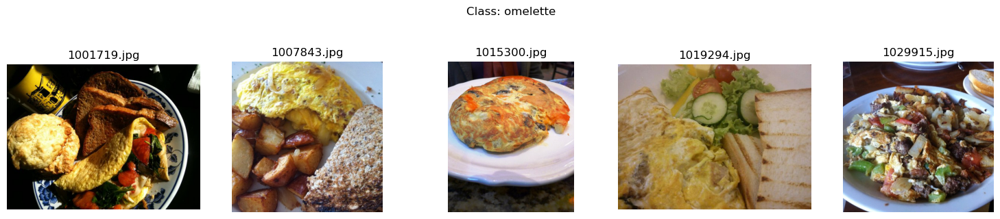


Class: pancakes (5 images)


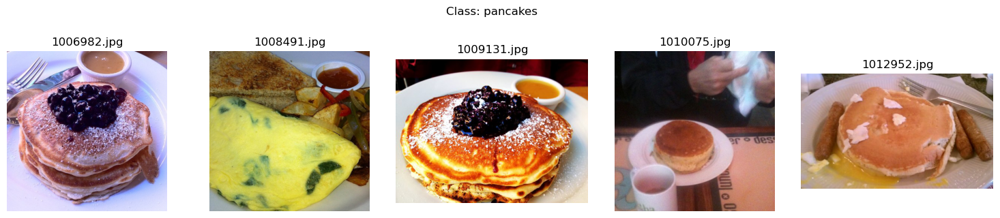


Class: pizza (5 images)


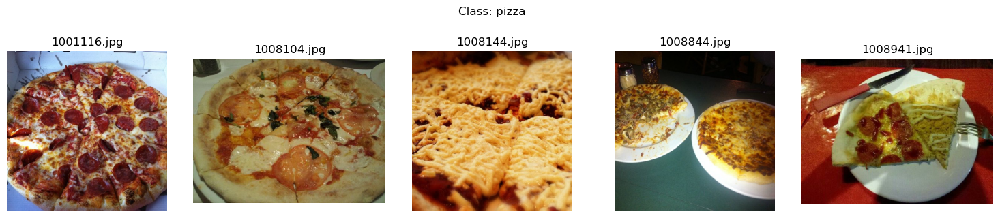


Class: pork_chop (5 images)


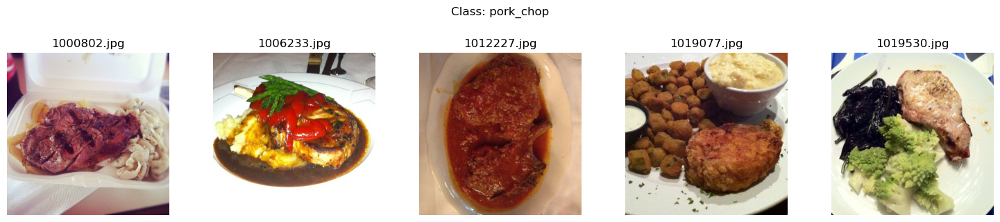


Class: samosa (5 images)


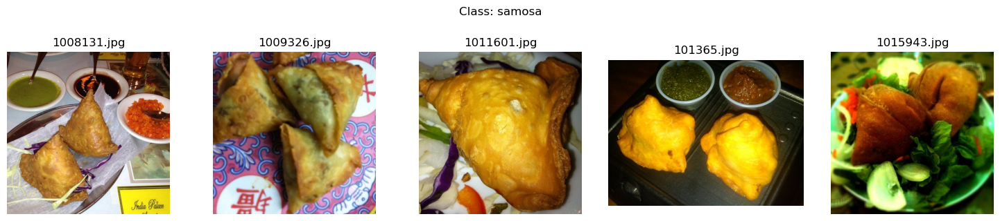


Class: spring_rolls (5 images)


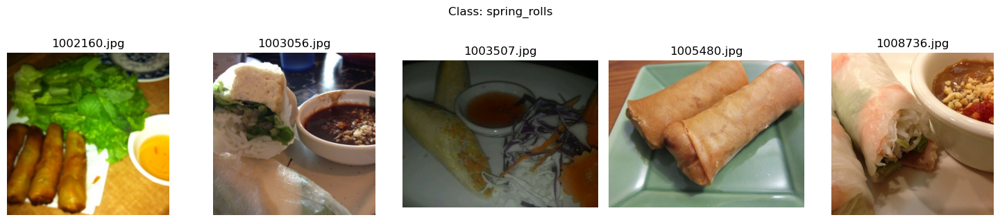


Class: waffles (5 images)


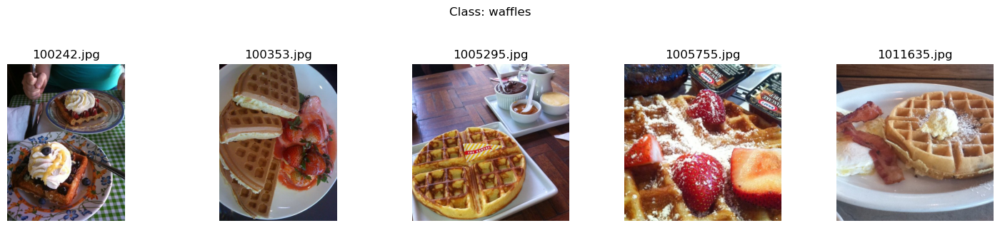

In [17]:
import matplotlib.pyplot as plt
from PIL import Image
import os

sample_folder = r"C:\Users\mpawe\Downloads\dataset"

# Dictionary to store images grouped by class (parent directory name)
class_images = {}

# Walk through all directories
for root, dirs, files in os.walk(sample_folder):
    # Get the immediate parent directory name
    class_name = os.path.basename(root)
    
    # Skip the root directory itself
    if root == sample_folder:
        continue
    
    # Collect up to 5 images per class
    if class_name not in class_images:
        class_images[class_name] = []
    
    for file in files:
        if len(class_images[class_name]) >= 5:
            break
            
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            class_images[class_name].append(os.path.join(root, file))

# Display 5 images for each class
for class_name, images in class_images.items():
    if not images:  # Skip classes with no images
        continue
        
    print(f"\nClass: {class_name} ({len(images)} images)")
    
    # Create a figure for this class
    plt.figure(figsize=(15, 3))
    plt.suptitle(f"Class: {class_name}", y=1.05)
    
    # Display up to 5 images in a row
    for i, img_path in enumerate(images[:5]):
        img = Image.open(img_path)
        
        plt.subplot(1, 5, i+1)
        plt.imshow(img)
        plt.title(os.path.basename(img_path))
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

In [18]:
from PIL import UnidentifiedImageError

# Check for corrupted images
for class_name, images in class_images.items():
    for img_path in images:
        try:
            img = Image.open(img_path)
            img.verify()  # Check if the image is valid
            print(f"Valid image: {img_path}")
        except UnidentifiedImageError:
            print(f"Corrupted image: {img_path}")
        except Exception as e:
            print(f"Error opening image {img_path}: {e}")


Valid image: C:\Users\mpawe\Downloads\dataset\images\chicken_wings\1003533.jpg
Valid image: C:\Users\mpawe\Downloads\dataset\images\chicken_wings\1008504.jpg
Valid image: C:\Users\mpawe\Downloads\dataset\images\chicken_wings\1009927.jpg
Valid image: C:\Users\mpawe\Downloads\dataset\images\chicken_wings\1010547.jpg
Valid image: C:\Users\mpawe\Downloads\dataset\images\chicken_wings\101104.jpg
Valid image: C:\Users\mpawe\Downloads\dataset\images\chocolate_cake\1001084.jpg
Valid image: C:\Users\mpawe\Downloads\dataset\images\chocolate_cake\1007122.jpg
Valid image: C:\Users\mpawe\Downloads\dataset\images\chocolate_cake\1007412.jpg
Valid image: C:\Users\mpawe\Downloads\dataset\images\chocolate_cake\1009391.jpg
Valid image: C:\Users\mpawe\Downloads\dataset\images\chocolate_cake\1012239.jpg
Valid image: C:\Users\mpawe\Downloads\dataset\images\donuts\100076.jpg
Valid image: C:\Users\mpawe\Downloads\dataset\images\donuts\100576.jpg
Valid image: C:\Users\mpawe\Downloads\dataset\images\donuts\1006

In [19]:
target_size = (224, 224)

# Resize images to a fixed size if needed
for class_name, images in class_images.items():
    for img_path in images:
        img = Image.open(img_path)
        if img.size != target_size:
            print(f"Resizing {img_path} from {img.size} to {target_size}")
            img = img.resize(target_size)
            # Save or process the resized images here if needed


Resizing C:\Users\mpawe\Downloads\dataset\images\chicken_wings\1003533.jpg from (512, 512) to (224, 224)
Resizing C:\Users\mpawe\Downloads\dataset\images\chicken_wings\1008504.jpg from (512, 512) to (224, 224)
Resizing C:\Users\mpawe\Downloads\dataset\images\chicken_wings\1009927.jpg from (512, 140) to (224, 224)
Resizing C:\Users\mpawe\Downloads\dataset\images\chicken_wings\1010547.jpg from (512, 512) to (224, 224)
Resizing C:\Users\mpawe\Downloads\dataset\images\chicken_wings\101104.jpg from (512, 384) to (224, 224)
Resizing C:\Users\mpawe\Downloads\dataset\images\chocolate_cake\1001084.jpg from (512, 512) to (224, 224)
Resizing C:\Users\mpawe\Downloads\dataset\images\chocolate_cake\1007122.jpg from (512, 341) to (224, 224)
Resizing C:\Users\mpawe\Downloads\dataset\images\chocolate_cake\1007412.jpg from (512, 512) to (224, 224)
Resizing C:\Users\mpawe\Downloads\dataset\images\chocolate_cake\1009391.jpg from (512, 341) to (224, 224)
Resizing C:\Users\mpawe\Downloads\dataset\images\cho

In [28]:
# Helper function to split dataset into train and test folders
def prepare_data(filepath, src, dest):
    classes_images = defaultdict(list)
    with open(filepath, 'r') as txt:
        paths = [read.strip() for read in txt.readlines()]
    for p in paths:
        food = p.split('/')
        classes_images[food[0]].append(food[1] + '.jpg')
    for food in classes_images.keys():
        print("\nCopying images into ", food)
        if not os.path.exists(os.path.join(dest, food)):
            os.makedirs(os.path.join(dest, food))
        for i in classes_images[food]:
            copy(os.path.join(src, food, i), os.path.join(dest, food, i))
    print("Copying Done!")

In [21]:
# Prepare train dataset
print("Creating train data...")
prepare_data(r'C:\Users\mpawe\Downloads\dataset\meta\train.txt', r'C:\Users\mpawe\Downloads\dataset\images', 'train')

Creating train data...

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  donuts

Copying images into  french_fries

Copying images into  french_toast

Copying images into  fried_rice

Copying images into  hamburger

Copying images into  ice_cream

Copying images into  omelette

Copying images into  pancakes

Copying images into  pizza

Copying images into  pork_chop

Copying images into  samosa

Copying images into  spring_rolls

Copying images into  waffles
Copying Done!


In [22]:
# Prepare test dataset
print("Creating test data...")
prepare_data(r'C:\Users\mpawe\Downloads\dataset\meta\test.txt', r'C:\Users\mpawe\Downloads\dataset\images', 'test')


Creating test data...

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  donuts

Copying images into  french_fries

Copying images into  french_toast

Copying images into  fried_rice

Copying images into  hamburger

Copying images into  ice_cream

Copying images into  omelette

Copying images into  pancakes

Copying images into  pizza

Copying images into  pork_chop

Copying images into  samosa

Copying images into  spring_rolls

Copying images into  waffles
Copying Done!


In [24]:
import os

def count_files(directory):
    try:
        # List all files in the directory
        files = os.listdir(directory)
        # Filter out directories, only count files
        num_files = sum([1 for file in files if os.path.isfile(os.path.join(directory, file))])
        return num_files
    except FileNotFoundError:
        print(f"The directory {directory} does not exist.")
        return 0




In [25]:
# Check number of samples in train folder
print("Total number of samples in train folder")
os.system(r"C:\Users\mpawe\Downloads\train")

Total number of samples in train folder


1

In [12]:
# List of all 15 types of foods
foods_sorted = ['chicken_wings','chocolate_cake','donuts','french_fries','french_toast','fried_rice','hamburger','ice_cream','omelette','pancakes','pizza','pork_chop','samosa','spring_rolls','waffles']
print(foods_sorted)

['chicken_wings', 'chocolate_cake', 'donuts', 'french_fries', 'french_toast', 'fried_rice', 'hamburger', 'ice_cream', 'omelette', 'pancakes', 'pizza', 'pork_chop', 'samosa', 'spring_rolls', 'waffles']


In [5]:
# Load pretrained ResNet50 model and fine-tune
tf.keras.backend.clear_session()
n_classes = 15
img_width, img_height = 224, 224
train_data_dir = 'train'
validation_data_dir = 'test'
nb_train_samples = 11250
nb_validation_samples = 3750
batch_size = 16

train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

resnet50 = ResNet50(weights='imagenet', include_top=False)
x = resnet50.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.2)(x)
predictions = Dense(n_classes, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)
model = Model(inputs=resnet50.input, outputs=predictions)
model.compile(optimizer=SGD(learning_rate=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

checkpointer = ModelCheckpoint(filepath='best_model_class.keras', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_class.log')

history = model.fit(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size,
    epochs=30,
    verbose=1,
    callbacks=[csv_logger, checkpointer])

model.save('model_trained_class.hdf5')
class_map = train_generator.class_indices
print(class_map)

Found 11250 images belonging to 15 classes.
Found 3750 images belonging to 15 classes.


C:\Users\mpawe\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
703/703 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.1890 - loss: 2.7186
Epoch 1: val_loss improved from inf to 2.75880, saving model to best_model_class.keras
703/703 ━━━━━━━━━━━━━━━━━━━━ 2337s 3s/step - accuracy: 0.1892 - loss: 2.7181 - val_accuracy: 0.2342 - val_loss: 2.7588
Epoch 2/30
  1/703 ━━━━━━━━━━━━━━━━━━━━ 37:12 3s/step - accuracy: 0.7500 - loss: 1.6760

C:\Users\mpawe\anaconda3\Lib\site-packages\keras\src\trainers\epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 2: val_loss improved from 2.75880 to 2.75229, saving model to best_model_class.keras
703/703 ━━━━━━━━━━━━━━━━━━━━ 171s 239ms/step - accuracy: 0.7500 - loss: 1.6760 - val_accuracy: 0.2358 - val_loss: 2.7523
Epoch 3/30
703/703 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5792 - loss: 1.5634
Epoch 3: val_loss improved from 2.75229 to 0.86288, saving model to best_model_class.keras
703/703 ━━━━━━━━━━━━━━━━━━━━ 2332s 3s/step - accuracy: 0.5793 - loss: 1.5632 - val_accuracy: 0.7855 - val_loss: 0.8629
Epoch 4/30
  1/703 ━━━━━━━━━━━━━━━━━━━━ 35:21 3s/step - accuracy: 0.7500 - loss: 0.8283
Epoch 4: val_loss improved from 0.86288 to 0.85966, saving model to best_model_class.keras
703/703 ━━━━━━━━━━━━━━━━━━━━ 171s 239ms/step - accuracy: 0.7500 - loss: 0.8283 - val_accuracy: 0.7858 - val_loss: 0.8597
Epoch 5/30
703/703 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.6876 - loss: 1.1581
Epoch 5: val_loss improved from 0.85966 to 0.72320, saving model to best_model_class.keras
703/703 ━━━━━━━━

{'chicken_wings': 0, 'chocolate_cake': 1, 'donuts': 2, 'french_fries': 3, 'french_toast': 4, 'fried_rice': 5, 'hamburger': 6, 'ice_cream': 7, 'omelette': 8, 'pancakes': 9, 'pizza': 10, 'pork_chop': 11, 'samosa': 12, 'spring_rolls': 13, 'waffles': 14}


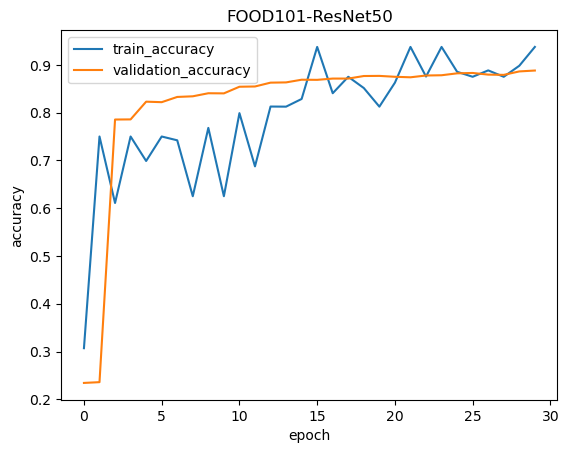

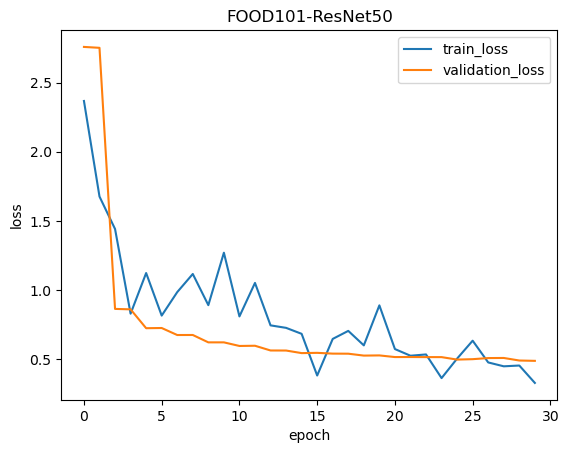

In [6]:
# Helper functions for plotting accuracy and loss
def plot_accuracy(history, title):
    plt.title(title)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train_accuracy', 'validation_accuracy'], loc='best')
    plt.show()

def plot_loss(history, title):
    plt.title(title)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train_loss', 'validation_loss'], loc='best')
    plt.show()

plot_accuracy(history, 'FOOD101-ResNet50')
plot_loss(history, 'FOOD101-ResNet50')

In [7]:
# Loading the best saved model to make predictions
tf.keras.backend.clear_session()
model_best = load_model(r'C:\Users\mpawe\Downloads\best_model_class.keras', compile=False)

In [22]:
# Helper function to predict class from images
def predict_class(model, images, show=True):
    food_list = list(train_generator.class_indices.keys())
    for img_path in images:
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.
        pred = model.predict(img_array)
        index = np.argmax(pred)
        food_list.sort()
        pred_value = food_list[index]
        if show:
            plt.imshow(img_array[0])
            plt.axis('off')
            plt.title(pred_value)
            plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


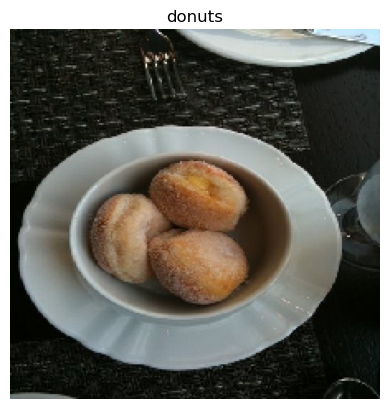

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


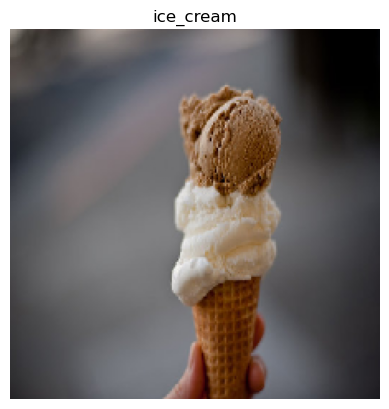

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


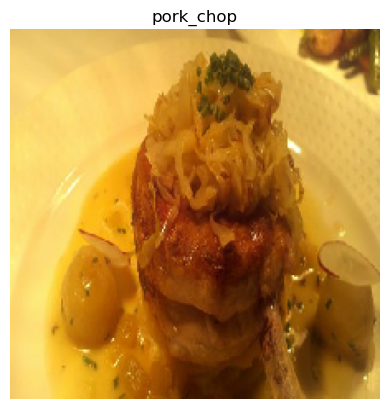

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


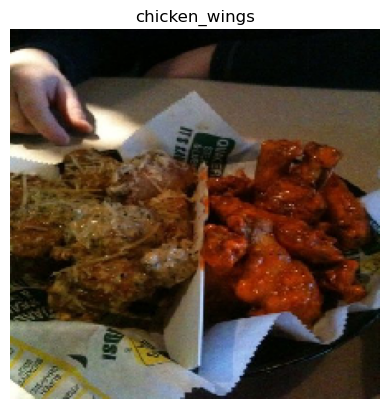

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


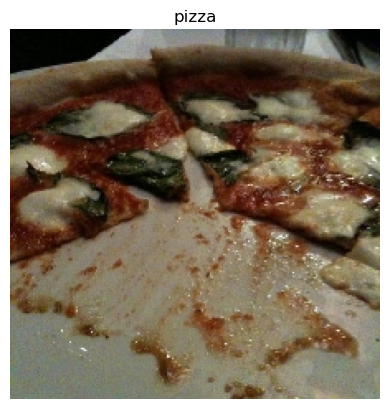

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


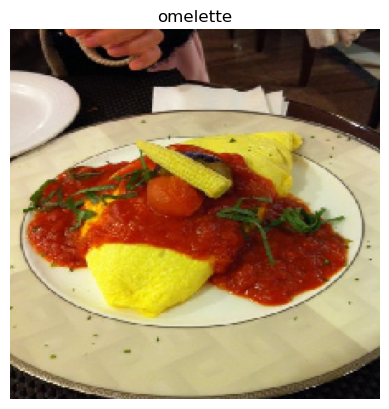

In [25]:
# Make a list of images from the test_mini directory and test the trained model
images = []
images.append(r"C:\Users\mpawe\Downloads\test\donuts\60893.jpg")
images.append(r"C:\Users\mpawe\Downloads\test\ice_cream\48073.jpg")
images.append(r"C:\Users\mpawe\Downloads\test\pork_chop\418847.jpg")
images.append(r"C:\Users\mpawe\Downloads\test\chicken_wings\414061.jpg")
images.append(r"C:\Users\mpawe\Downloads\test\pizza\513415.jpg")
images.append(r"C:\Users\mpawe\Downloads\test\omelette\361660.jpg")
predict_class(model_best, images, True)


In [26]:
# Nutritional labeling dictionary for food classes
nutri_dict = {
    'chicken_wings': 'unhealthy',
    'chocolate_cake': 'unhealthy',
    'donuts': 'unhealthy',
    'french_fries': 'unhealthy',
    'french_toast': 'healthy',
    'fried_rice': 'healthy',
    'hamburger': 'unhealthy',
    'ice_cream': 'unhealthy',
    'omelette': 'healthy',
    'pancakes': 'healthy',
    'pizza': 'unhealthy',
    'pork_chop': 'healthy',
    'samosa': 'unhealthy',
    'spring_rolls': 'unhealthy',
    'waffles': 'unhealthy'
}

# Define class map
class_map = {
    'chicken_wings': 0,
    'chocolate_cake': 1,
    'donuts': 2,
    'french_fries': 3,
    'french_toast': 4,
    'fried_rice': 5,
    'hamburger': 6,
    'ice_cream': 7,
    'omelette': 8,
    'pancakes': 9,
    'pizza': 10,
    'pork_chop': 11,
    'samosa': 12,
    'spring_rolls': 13,
    'waffles': 14
}

In [27]:
# Function to predict class and nutritional labeling
def predict_class_and_nutriLabel(model, images, show=True):
    for img_path in images:
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.
        pred = model.predict(img_array)
        index = np.argmax(pred)
        predicted_class = list(class_map.keys())[list(class_map.values()).index(index)]
        predicted_nutri_label = nutri_dict[predicted_class]
        if show:
            plt.imshow(img_array[0])
            plt.axis('off')
            plt.title(f"{predicted_class} - {predicted_nutri_label}")
            plt.show()
        print(f"Predicted: {predicted_class}, Estimated nutritional label: {predicted_nutri_label}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


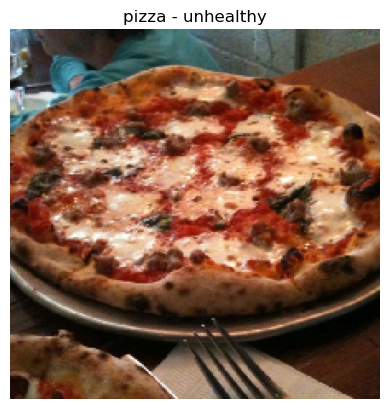

Predicted: pizza, Estimated nutritional label: unhealthy
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


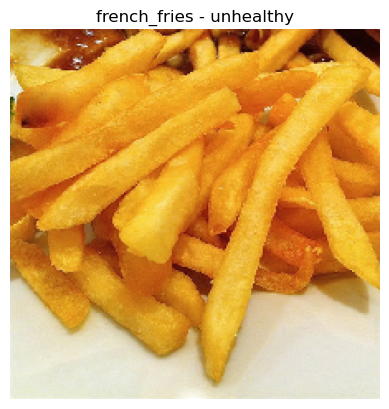

Predicted: french_fries, Estimated nutritional label: unhealthy


In [29]:
# List of images to predict
images = [
    r"C:\Users\mpawe\Downloads\test\pizza\645087.jpg",
    r"C:\Users\mpawe\Downloads\test\french_fries\782182.jpg"
]

# Run prediction test with calorie estimation
predict_class_and_nutriLabel(model_best, images, True)